## **Part 3: Warp 7 images over a new projection to create a wide panorama**

En el ejercicio 2 observamos que el detector y descriptor que mejor funciona es el SIFT, por lo que será el que usemos en nuestro caso. Como estrategia de matching usaremos el BFmatcher. 

In [1]:
filenames = ["images/0.png", "images/1.png", "images/2.png", "images/3.png", "images/4.png", "images/5.png", "images/6.png"]

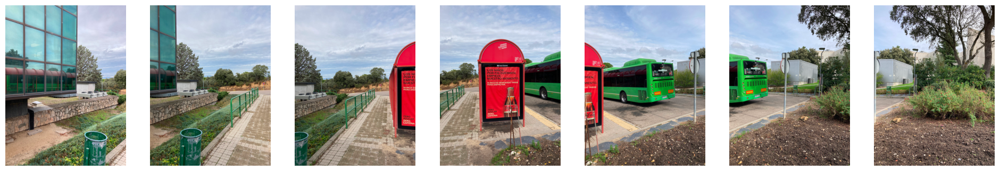

In [2]:
### TODO
# Draw images
import cv2
import matplotlib.pyplot as plt
import copy
import time

def draw_images(images):
    width = len(images)
    fig, axes = plt.subplots(1, width, figsize=(24, 6))
    
    if width == 1:
        axes = [axes]
        
    for i in range(width):
        axes[i].imshow(images[i])
        axes[i].axis("off")

imgs = []

for i in filenames:
    img = cv2.imread(i)
    img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img_color)

draw_images(imgs)


Ahora haremos una proyeccion cilindrica de las imagenes para poder mejorar el problema de las distorsiones

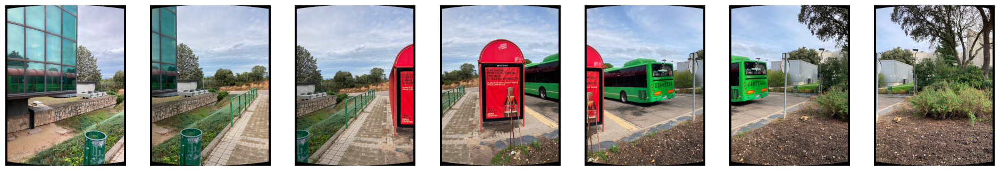

In [3]:
import numpy as np

def cylindrical_projection(img, f):
    h, w = img.shape[:2]
    y, x = np.indices((h, w))
    
    center_x, center_y = w / 2, h / 2
    
    theta = (x - center_x) / f  # Ángulo en X
    h_cap = (y - center_y) / f  # Ángulo en Y

    X = np.tan(theta)
    Y = h_cap / np.cos(theta)
    
    u = (f * X + center_x).astype(np.int32)
    v = (f * Y + center_y).astype(np.int32)
    
    mask = (u >= 0) & (u < w) & (v >= 0) & (v < h)
    
    cyl = np.zeros_like(img)
    cyl[y[mask], x[mask]] = img[v[mask], u[mask]]
    
    return cyl

f = imgs[0].shape[1] * 1.5
cyl_images = [cylindrical_projection(img, f) for img in imgs]

draw_images(cyl_images)

Ahora vamos a detectar keypoints de las imagenes con SIFT, usando tambien el descriptor SIFT para describir estos keypoints

In [4]:
def extract_sift_features(images):
    
    sift_detector = cv2.SIFT_create()
    keypoints_list = []
    descriptors_list = []

    time_start = time.time()
    
    for img in images:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        kp, des = sift_detector.detectAndCompute(gray, None)
        
        keypoints_list.append(kp)
        descriptors_list.append(des)
        
    time_end = time.time()
    
    duration = time_end - time_start
    kp_counts = [len(kp) for kp in keypoints_list]
    print(f"Tiempo total SIFT: {duration:.4f} segundos")
    print(f"Keypoints detectados: {kp_counts}")

    return keypoints_list, descriptors_list

Tiempo total SIFT: 6.0906 segundos
Keypoints detectados: [24077, 25394, 22334, 17197, 18165, 34164, 52430]


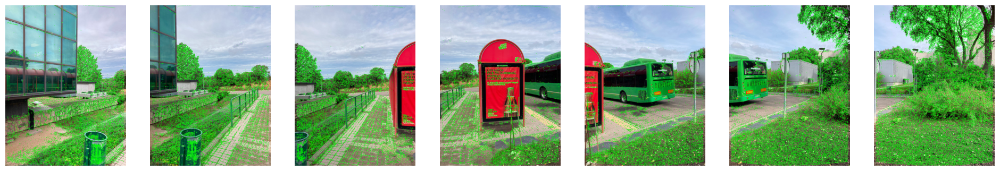

In [5]:
keypoints, descriptors = extract_sift_features(cyl_images)

_imgs = copy.deepcopy(imgs)

for idx in range(len(_imgs)):
    cv2.drawKeypoints(_imgs[idx], keypoints[idx], _imgs[idx], (0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

draw_images(_imgs)

Como se nos pide poder sacar el orden de las imagenes, ya que presuponemos que todas las imagenes que se nos den van a estar desordenadas, tenemos que buscar el orden en las imagenes usando las correspondencias para asignar imagenes adyacentes.

In [6]:
def get_alignment_score(kp1, kp2, des1, des2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)
    
    if len(matches) < 10: # Umbral min de seguridad
        return 0
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    if mask is None:
        return 0
    
    return np.sum(mask)

In [7]:
def find_image_order(images, keypoints, descriptors, min_matches=100):
    n = len(images)
    bf = cv2.BFMatcher()

    match_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(i + 1, n):
            matches = bf.knnMatch(descriptors[i], descriptors[j], k=2)
            good = []
            for m, n_match in matches:
                if m.distance < 0.7 * n_match.distance:
                    good.append(m)
            
            match_matrix[i, j] = len(good)
            match_matrix[j, i] = len(good)

    def greedy_path(start):
        remaining = set(range(n))
        path = [start]
        remaining.remove(start)

        while remaining:
            last = path[-1]
            best_next = max(remaining, key=lambda x: match_matrix[last, x])
            path.append(best_next)
            remaining.remove(best_next)

        return path

    best_order = None
    best_score = -1

    for start in range(n):
        path = greedy_path(start)
        score = sum(match_matrix[path[k], path[k + 1]] for k in range(n - 1))
        if score > best_score:
            best_score = score
            best_order = path

    print(f"Orden sugerido de las imagenes: {[int(i) for i in best_order]}")
    return best_order

def sort_images_by_order(images, order):
    return [images[i] for i in order]

def sort_keypoints_descrip(order, keypoints, descriptors):
    sorted_keypoints = [keypoints[i] for i in order]
    sorted_descriptors = [descriptors[i] for i in order]
    return sorted_descriptors, sorted_keypoints


In [8]:
def BFmatch_features(images, keypoints, descriptors, max_matches=50):

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    
    matches_list = []
    
    for i in range(len(images) - 1):
        matches = bf.match(descriptors[i], descriptors[i+1])
        
        # Ordenar por distancia
        matches = sorted(matches, key=lambda x: x.distance)
        matches_list.append(matches)
        
    print(f"SIFT matches encontrados por par: {[len(m) for m in matches_list]}")

    return matches_list

Orden sugerido de las imagenes: [0, 1, 2, 3, 4, 5, 6]


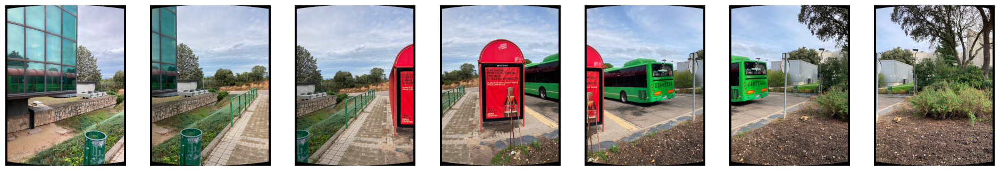

In [9]:
order = find_image_order(cyl_images, keypoints, descriptors)
sorted_imgs = sort_images_by_order(cyl_images, order)
sorted_desc, sorted_kp = sort_keypoints_descrip(order, keypoints, descriptors)

draw_images(sorted_imgs)

Una vez detectamos el orden, debemos de sacar las homografias. Pero en este caso, al usar una proyeccion cilindrica a las imagenes, bastara con usar matrices de traslaciones

In [10]:
def compute_cumulative_translations(sorted_kp, sorted_desc):
    bf = cv2.BFMatcher()
    translations = [(0, 0)]  # primera imagen

    for i in range(1, len(sorted_desc)):
        matches = bf.knnMatch(sorted_desc[i-1], sorted_desc[i], k=2)

        good = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good.append(m)

        if len(good) < 10:
            translations.append(translations[-1])
            continue

        dx = []
        dy = []

        for m in good:
            x1, y1 = sorted_kp[i-1][m.queryIdx].pt
            x2, y2 = sorted_kp[i][m.trainIdx].pt
            dx.append(x1 - x2)
            dy.append(y1 - y2)

        dx_med = np.median(dx)
        dy_med = np.median(dy)

        prev_x, prev_y = translations[-1]
        translations.append((prev_x + dx_med, prev_y + dy_med))

    return translations


Estimamos el tamaño del canvas

In [11]:
def estimate_canvas_size(images, homographies):
    
    corners = []

    for img, H in zip(images, homographies):
        h, w = img.shape[:2]
        img_corners = np.array([
            [0,0],
            [0,h],
            [w,0],
            [w,h]
        ], dtype=np.float32).reshape(-1,1,2)

        transformed_corners = cv2.perspectiveTransform(img_corners, H)
        corners.append(transformed_corners)

    corners = np.vstack(corners)
    x_min, y_min = corners.min(axis=0).ravel()
    x_max, y_max = corners.max(axis=0).ravel()

    width = int(np.ceil(x_max - x_min))
    height = int(np.ceil(y_max - y_min))
    
    offset = np.array([[1, 0, -x_min],
                       [0, 1, -y_min],
                       [0, 0, 1]])

    return width, height, offset


In [12]:
def stitch_images_translation(images, translations):
    # calcular canvas
    xs = [t[0] for t in translations]
    ys = [t[1] for t in translations]

    min_x, max_x = int(min(xs)), int(max(xs))
    min_y, max_y = int(min(ys)), int(max(ys))

    h, w = images[0].shape[:2]

    width = w + (max_x - min_x)
    height = h + (max_y - min_y)

    panorama = np.zeros((height, width, 3), dtype=np.uint8)

    for img, (tx, ty) in zip(images, translations):
        x = int(tx - min_x)
        y = int(ty - min_y)

        panorama[y:y+h, x:x+w] = np.maximum(
            panorama[y:y+h, x:x+w],
            img
        )

    return panorama


(2069, 5274, 3)


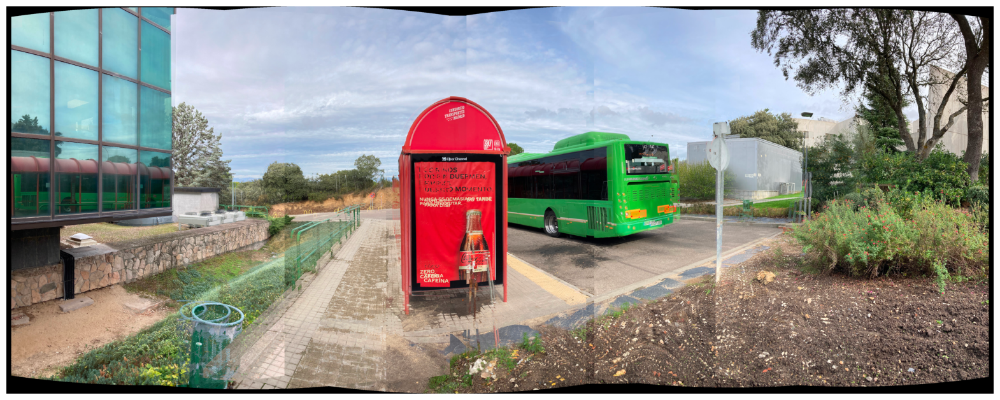

In [13]:
trans = compute_cumulative_translations(sorted_kp, sorted_desc)
panorama = stitch_images_translation(sorted_imgs, trans)

print(panorama.shape)

plt.figure(figsize=(20,10))
plt.imshow(panorama)
plt.axis("off")
plt.show()



Vemos que este panorama presenta bastantes problemas, muchos artefactos, como borrosidad en las imagenes, franjas donde se ha superpuesto mal, entre otros. Buscaremos mejorar esto con los distintos métodos de blending

#### Alpha blending

(2069, 5274, 3)


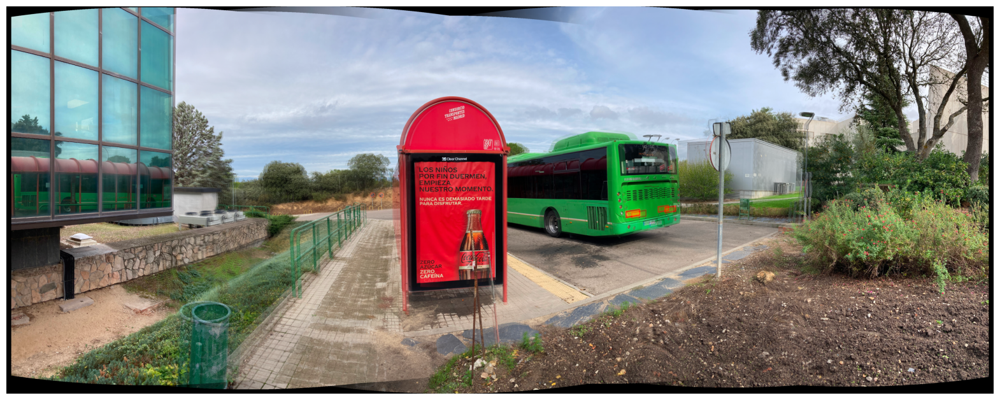

In [19]:
def alpha_blend(imgA, imgB, mask):

    if len(mask.shape) == 2:
        mask = cv2.merge([mask, mask, mask])
    
    blended = (imgA.astype(np.float32) * mask) + (imgB.astype(np.float32) * (1.0 - mask))
    
    return np.clip(blended, 0, 255).astype(np.uint8)


def stitch_alpha(images, translations):
    translations = np.array(translations)
    translations -= translations.min(axis=0)
    translations = translations.astype(int)

    h_max, w_max = 0, 0
    for i in range(len(images)):
        h, w = images[i].shape[:2]
        x, y = translations[i]
        w_max = max(w_max, x + w)
        h_max = max(h_max, y + h)

    canvas = np.zeros((h_max, w_max, 3), dtype=np.uint8)
    
    h0, w0 = images[0].shape[:2]
    x0, y0 = translations[0]
    canvas[y0:y0+h0, x0:x0+w0] = images[0]

    for i in range(1, len(images)):
        img = images[i].astype(np.uint8)
        x, y = translations[i]
        h, w = img.shape[:2]

        roi = canvas[y:y+h, x:x+w].copy()
        
        content_mask = (np.max(roi, axis=2) > 0).astype(np.float32)
        alpha_mask = np.zeros((h, w), dtype=np.float32)
        
        overlap_indices = np.where(content_mask.any(axis=0))[0]
        
        if len(overlap_indices) > 0:
            start = overlap_indices.min()
            end = overlap_indices.max()
            
            alpha_mask[:, :start] = 1.0

            ramp_width = end - start + 1
            alpha_mask[:, start:end+1] = np.linspace(1.0, 0.0, ramp_width)
            alpha_mask[:, end+1:] = 0.0
        else:
            alpha_mask[:] = 0.0

        blended_roi = alpha_blend(roi, img, alpha_mask)
        
        img_mask = (np.max(img, axis=2) > 0)
        canvas[y:y+h, x:x+w][img_mask] = blended_roi[img_mask]

    return canvas


panorama = stitch_alpha(sorted_imgs, trans)

print(panorama.shape)

plt.figure(figsize=(20, 10))
plt.imshow(panorama)
plt.axis("off")
plt.show()

Podemos observar duplicidad y borrosidad de las imagenes, que se notan fuertemente en la parte de atrás del autobús, la papelera, la valla y la señal de la derecha. Esto, aunque mejora a la imagen anterior, se podría mejorar usando otro tipo de blending como los que veremos a continuación

#### Multiband blending

(2069, 5274, 3)


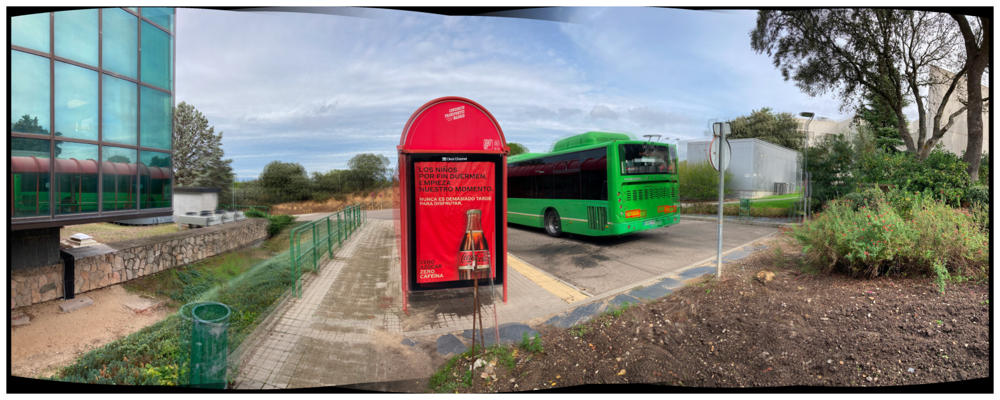

In [21]:
def GaussianPyramid(img, leveln):
    GP = [img.astype(np.float32)]
    for _ in range(leveln - 1):
        GP.append(cv2.pyrDown(GP[-1]))
    return GP

def LaplacianPyramid(img, leveln):
    GP = GaussianPyramid(img, leveln)
    LP = []
    for i in range(leveln - 1):
        size = (GP[i].shape[1], GP[i].shape[0])
        up = cv2.pyrUp(GP[i+1], dstsize=size)
        up = cv2.resize(up, size) 
        LP.append(GP[i] - up)
    LP.append(GP[-1])
    return LP

def multiband_blend(imgA, imgB, mask, leveln=6):

    if len(mask.shape) == 2:
        mask = cv2.merge([mask, mask, mask])
    
    lpA = LaplacianPyramid(imgA, leveln)
    lpB = LaplacianPyramid(imgB, leveln)
    gpM = GaussianPyramid(mask, leveln)
    
    blended_pyr = []
    for la, lb, gm in zip(lpA, lpB, gpM):

        blended_pyr.append(la * gm + lb * (1.0 - gm))
    
    img = blended_pyr[-1]
    for i in range(leveln - 2, -1, -1):
        size = (blended_pyr[i].shape[1], blended_pyr[i].shape[0])
        img = cv2.pyrUp(img, dstsize=size)
        img = cv2.resize(img, size)
        img += blended_pyr[i]
        
    return np.clip(img, 0, 255).astype(np.uint8)


def stitch_multiband(images, translations, leveln=6):
    translations = np.array(translations)
    translations -= translations.min(axis=0)
    translations = translations.astype(int)

    h_max, w_max = 0, 0
    for i in range(len(images)):
        h, w = images[i].shape[:2]
        x, y = translations[i]
        w_max = max(w_max, x + w)
        h_max = max(h_max, y + h)

    canvas = np.zeros((h_max, w_max, 3), dtype=np.uint8)
    h0, w0 = images[0].shape[:2]
    x0, y0 = translations[0]
    canvas[y0:y0+h0, x0:x0+w0] = images[0]

    for i in range(1, len(images)):
        img = images[i].astype(np.uint8)
        x, y = translations[i]
        h, w = img.shape[:2]

        roi = canvas[y:y+h, x:x+w].copy()
        
        content_mask = (np.max(roi, axis=2) > 0).astype(np.float32)
        
        mask_blend = np.zeros((h, w), dtype=np.float32)
        
        overlap_indices = np.where(content_mask.any(axis=0))[0]
        
        if len(overlap_indices) > 0:
            overlap_start = overlap_indices.min()
            overlap_end = overlap_indices.max()
            
            mask_blend[:, :overlap_start] = 1.0
            
            ramp_width = overlap_end - overlap_start + 1
            ramp = np.linspace(1.0, 0.0, ramp_width)
            mask_blend[:, overlap_start:overlap_end+1] = ramp
            
            mask_blend[:, overlap_end+1:] = 0.0
        else:
            mask_blend[:] = 0.0

        blended_roi = multiband_blend(roi, img, mask_blend, leveln)
        
        img_mask = (np.max(img, axis=2) > 0)
        canvas_roi = canvas[y:y+h, x:x+w]
        canvas_roi[img_mask] = blended_roi[img_mask]

    return canvas


panorama = stitch_multiband(sorted_imgs, trans, leveln=6)

print(panorama.shape)

plt.figure(figsize=(20, 10))
plt.imshow(panorama)
plt.axis("off")
plt.show()

En este metodo de blending notamos una mejoria considerable, aunque tambien observamos problemas de borrosidad y duplicidad de objetos como por ejemplo la papelera de la derecha y la valla verde. Podemos observar que la mejoría con el método de blending anterior es ínfima

#### Graph cut blending

(2069, 5222, 3)


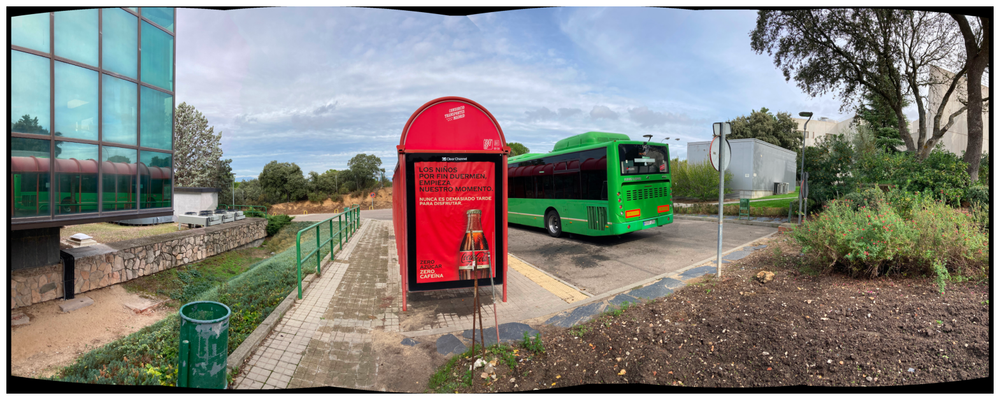

In [ ]:
def find_seam_mask(roi, img, overlap_start, overlap_end):

    h, w = roi.shape[:2]
    overlap_roi = roi[:, overlap_start:overlap_end+1]
    overlap_img = img[:, overlap_start:overlap_end+1]
    
    diff = np.sum((overlap_roi.astype(float) - overlap_img.astype(float))**2, axis=2)
    
    dist = diff.copy()
    backtrack = np.zeros_like(dist, dtype=int)
    
    for y in range(1, h):
        for x in range(dist.shape[1]):
            prev_indices = np.arange(max(0, x-1), min(dist.shape[1], x+2))
            best_prev = prev_indices[np.argmin(dist[y-1, prev_indices])]
            dist[y, x] += dist[y-1, best_prev]
            backtrack[y, x] = best_prev
            
    mask = np.zeros((h, w), dtype=np.float32)
    curr_x = np.argmin(dist[-1, :])
    
    for y in reversed(range(h)):

        mask[y, :overlap_start + curr_x] = 1.0
        curr_x = backtrack[y, curr_x]
        
    return mask


def stitch_graph_cut(images, translations):
    translations = np.array(translations)
    translations -= translations.min(axis=0)
    translations = translations.astype(int)

    h_max, w_max = 0, 0
    for i in range(len(images)):
        h, w = images[i].shape[:2]
        x, y = translations[i]
        w_max = max(w_max, x + w)
        h_max = max(h_max, y + h)

    canvas = np.zeros((h_max, w_max, 3), dtype=np.uint8)
    
    h0, w0 = images[0].shape[:2]
    x0, y0 = translations[0]
    canvas[y0:y0+h0, x0:x0+w0] = images[0]

    for i in range(1, len(images)):
        img = images[i].astype(np.uint8)
        x, y = translations[i]
        h, w = img.shape[:2]

        roi = canvas[y:y+h, x:x+w].copy()
        content_mask = (np.max(roi, axis=2) > 0).astype(np.uint8)
        
        overlap_indices = np.where(content_mask.any(axis=0))[0]
        
        if len(overlap_indices) > 10:
            start = overlap_indices.min()
            end = overlap_indices.max()
            
            mask = find_seam_mask(roi, img, start, end)

            mask_soft = cv2.GaussianBlur(mask, (5, 5), 0)
            mask_soft = cv2.merge([mask_soft]*3)
            
            blended_roi = (roi.astype(float) * mask_soft + img.astype(float) * (1.0 - mask_soft))
            blended_roi = np.clip(blended_roi, 0, 255).astype(np.uint8)
        else:
            blended_roi = img
            
        img_mask = (np.max(img, axis=2) > 0)
        canvas[y:y+h, x:x+w][img_mask] = blended_roi[img_mask]

    return canvas


panorama = stitch_graph_cut(sorted_imgs, trans)
print(panorama.shape)

plt.figure(figsize=(20, 10))
plt.imshow(panorama)
plt.axis("off")
plt.show()

En este método de blending es donde notamos un gran salto en la mejoría. Han desaparecido por completo los objetos borrosos de la imagen y no encontramos franjas que separen las imágenes. Esto es a cambio de un gran costo computacional. Nosotros hemos decidido que este es el mejor método para nuestro caso.